In [1]:
using DrWatson
@quickactivate "TopoStochSim"

In [2]:
using Revise
using GraphModels, ComplexAllostery, ComplexAllostery.Model3
using WGLMakie, LaTeXStrings

Precompiling packages...
  16139.1 ms  ✓ GraphModels
  1 dependency successfully precompiled in 20 seconds. 327 already precompiled.
Precompiling packages...
  16497.0 ms  ✓ ComplexAllostery
  1 dependency successfully precompiled in 18 seconds. 331 already precompiled.


In [79]:
N = 6
vs = vars_simplified(energies=nothing)

function cca_fact(args...)
    ts = Dict{Num,Float64}([
        symvars.sim_rs;
        symvars.energies;
        symvars.concentrations[1];
        symvars.redconcentration
    ] .=> args)
    makeCAGM(N, substitute_to_float(vs, ts))
end

ca = makeCAGM(N, vs)
# plotgm(ca; felabels=false)

monomer energies 2×2 Matrix{Num}:
    0          ε_t
 Δε_r  -Δε_r + ε_t
interaction energies 2×2 Matrix{Num}:
   0  ε_b
 ε_b    0{4096, 49152} directed simple Int64 graph with Num weightsnothing3.0Dict{String, SystemVars{Num}} with 1 entry:
  "vars" => SystemVars{Num}(Num[ε_t, Δε_r, ε_b], (Num[r₁, r₁], Num[r₂, r₂*α], r…

CAGM{Loop, Num, Int64}
N=6, C=2, B=1
energy_matrices:

graph: 
environment: 
version: 
metadata:


## Exploration

length(sss) = 1


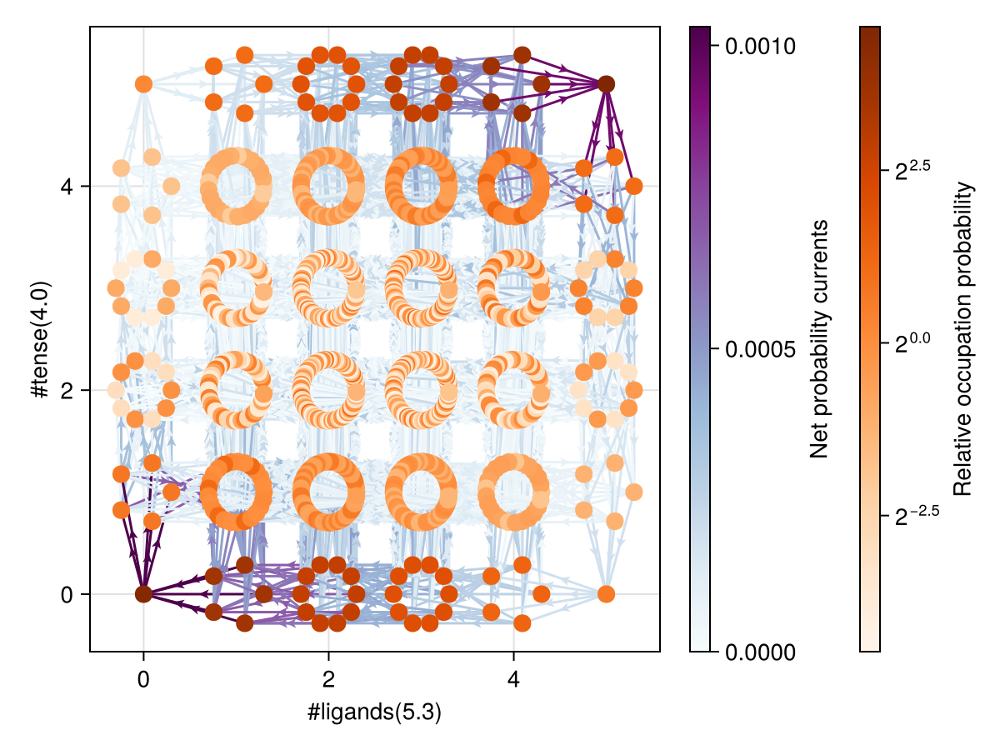

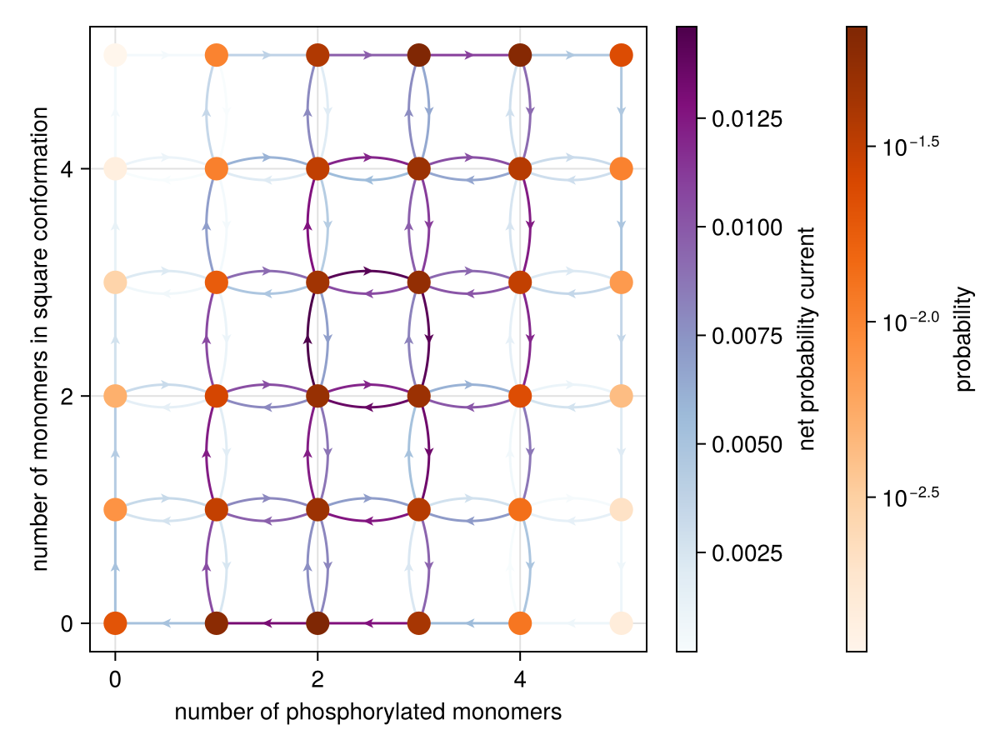

In [93]:
cca = cca_fact(1., 1., 1., 0, 0., 0., 1., 0.5, 100.)
sss = steadystates(cca)
@show length(sss)
ss = mean(sss)
display(plotgm(cca; ss, flabels=false, n_ss_color=:relss, n_ss_colorscale=log2))
plotca_macro(cca, ss)

length(sss) = 1


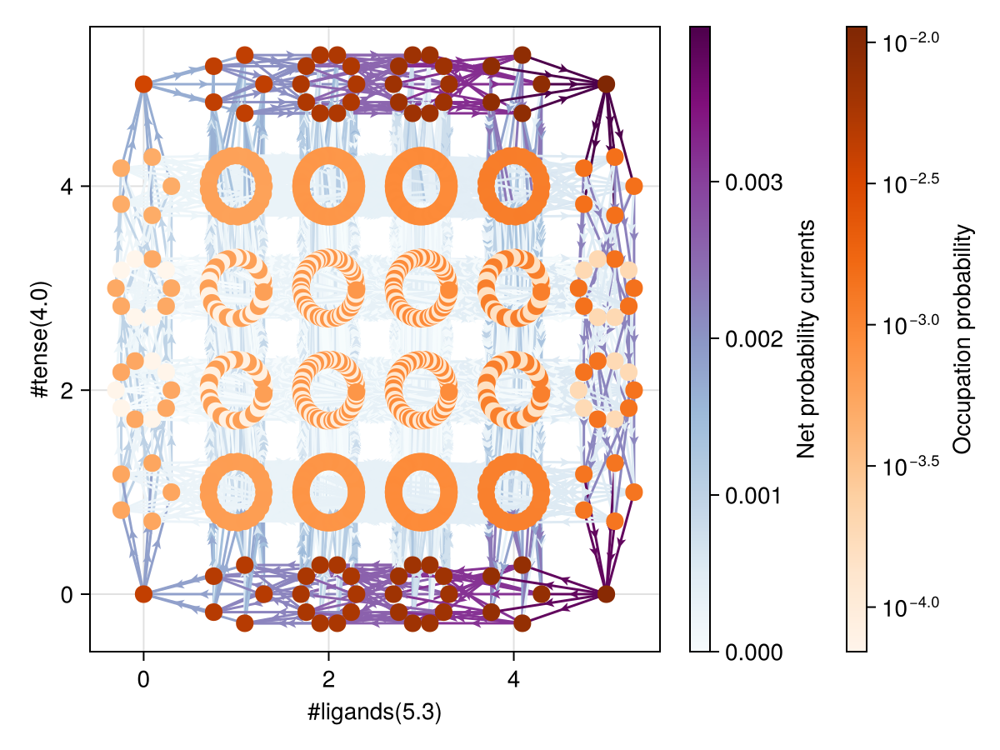

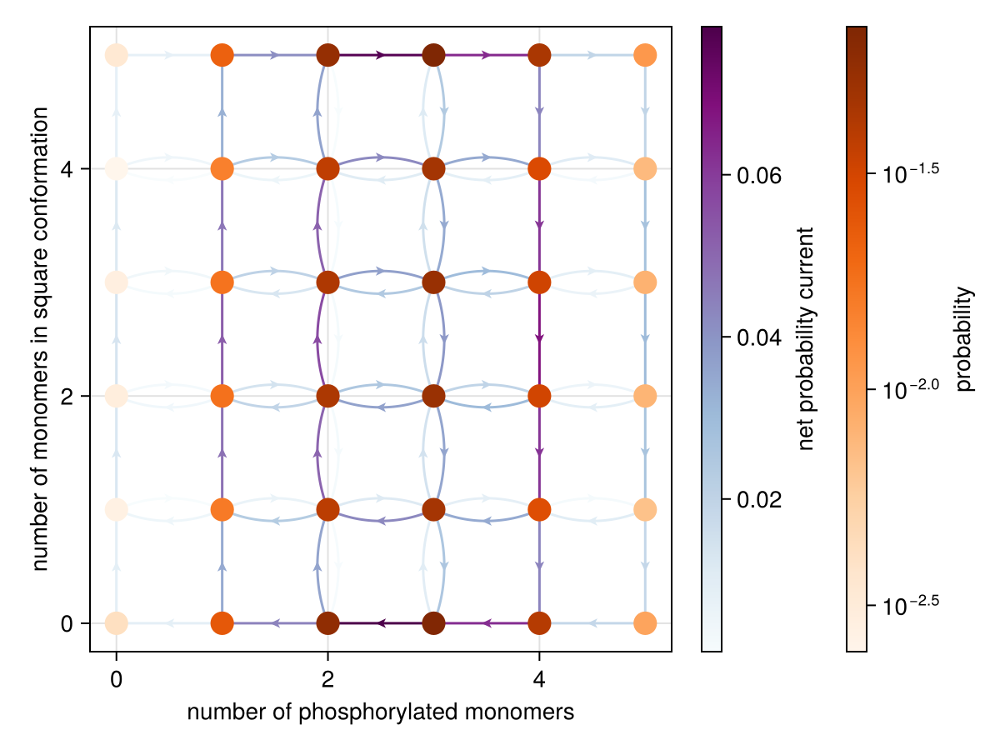

In [44]:
cca = cca_fact(1., 1., 100., 0, 0., 0., 1, 0.5, 100.)
sss = steadystates(cca)
@show length(sss)
ss = mean(sss)
display(plotgm(cca; ss, flabels=false))
plotca_macro(cca, ss)

In [30]:
cca = cca_fact(10., 10., 100., 0, 0., 0., 2, 0.5, 100.)
sss = steadystates(cca)
@show length(sss)
ss = mean(sss)
#plotgm(cca; ss, fnlabels=false, n_ss_colorscale=log10)
plotca_macro(cca, ss)

length(sss) = 1


length(sss) = 1


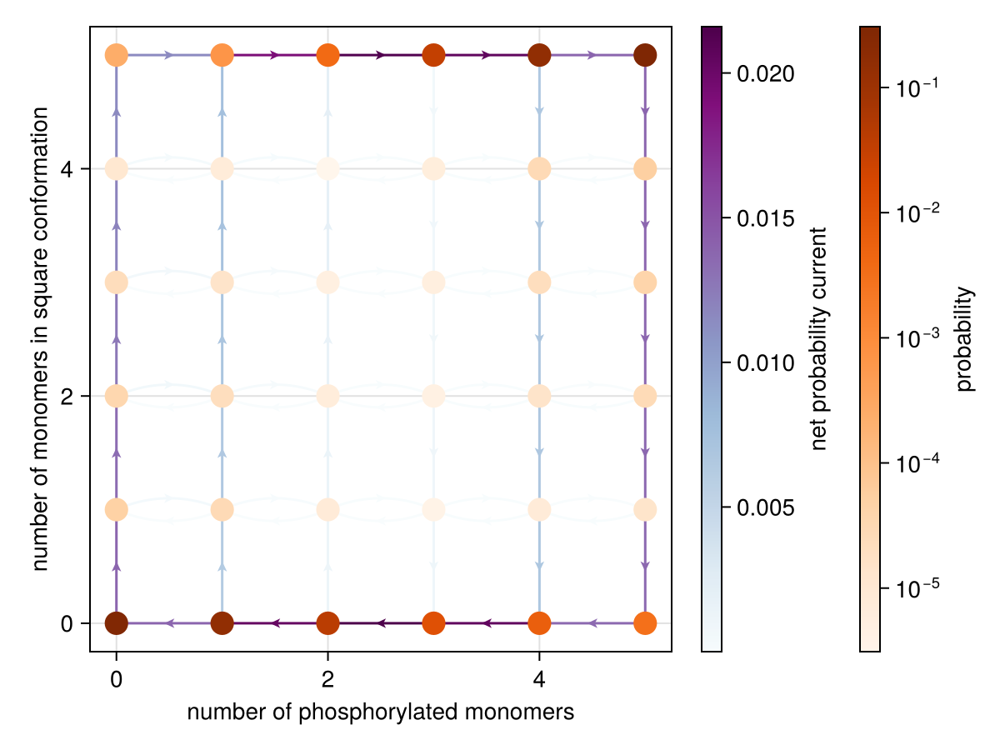

In [107]:
cca = cca_fact(1., 10., 1000., 0, 0., 0., 5, 0.1, 100.)
sss = steadystates(cca)
@show length(sss)
ss = mean(sss)
#plotgm(cca; ss, fnlabels=false, n_ss_colorscale=log10)
plotca_macro(cca, ss)

In [14]:
cca = cca_fact(1., 1., 100., 0, 0., 0., 2, 0.5, 100.)
sss = steadystates(cca)
@show length(sss)
ss = mean(sss)
plotgm(cca; ss, fnlabels=false, n_ss_colorscale=log10)
# plotca_macro(cca, ss;
    # n_ss_colorscale=identity
# )

length(sss) = 1


In [15]:
cca = cca_fact(1., 1., 5., 0, 0., 0.5, 0., 1., 1.)
sss = steadystates(cca)
@show length(sss)
ss = mean(sss)
plotgm(cca; ss, n_ss_colorscale=log10)
#plotca_macro(cca, ss, n_ss_colorscale=identity)

length(sss) = 1


In [16]:
cca.energy_matrices

monomer energies 2×2 Matrix{Float64}:
 0.0   0.0
 0.5  -0.5
interaction energies 2×2 Matrix{Float64}:
 0.0  0.0
 0.0  0.0

In [ ]:
ca.energy_matrices

## Actual poster plots

length(sss) = 1


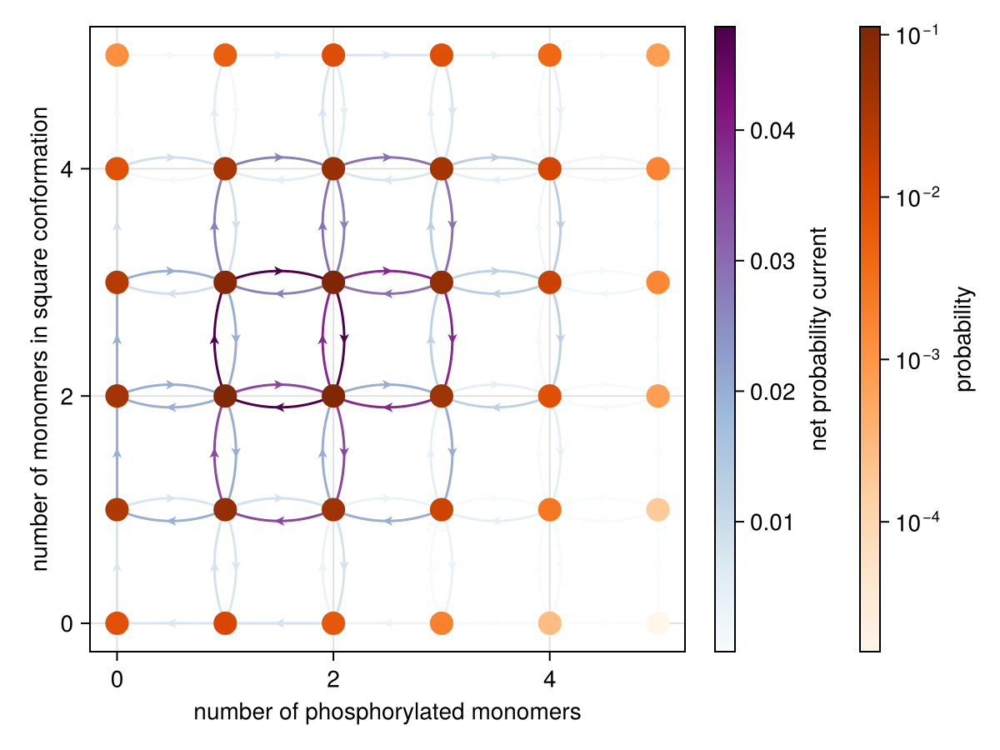

In [71]:
cca = cca_fact(1., 1., 1., 0, 0., 0., 0., 0.1, 100.)
sss = steadystates(cca)
@show length(sss)
ss = mean(sss)
#plotgm(cca; ss, n_ss_colorscale=log10)
faa = plotca_macro(cca, ss)

In [140]:
using CairoMakie
# these are relative to 1 CSS px
su_inch = 96
su_pt = 4/3
su_cm = su_inch / 2.54
su_mm = su_cm / 10

function adjust_faa1!(faa)
    faa.axis.xlabel = "num phosphorylations"
    faa.axis.ylabel = "num squares"
    
    # tweak things
    faa.figure.content[2].labelsize = 14
    faa.figure.content[2].ticklabelsize = 14
    faa.figure.content[2].labelpadding = 1.
    faa.figure.content[3].labelsize = 14
    faa.figure.content[3].ticklabelsize = 14
    faa.figure.content[3].labelpadding = 1.
    
    faa.axis.xlabelpadding = -7
    faa.axis.xticklabelsize = 18*su_pt
    faa.axis.yticklabelsize = 18*su_pt
end

ca_fig_params = (;
    size=(180*su_mm, 120*su_mm),
    fontsize=20*su_pt,
    backgroundcolor=:transparent
)

nothing

### Basic/bulk

In [134]:
cca1 = cca_fact(1., 1., 1., 0, 0., 0., 0., 0.1, 100.)
sss1 = steadystates(cca1)
ss1 = mean(sss1)

4096-element Vector{Float64}:
 0.0003224288488988505
 0.00048059551722684735
 0.00048059551722682664
 0.0007163504505485189
 0.0004805955172268197
 0.0007163504505485342
 0.0007163504505485389
 0.0010677543789050104
 0.0004805955172268413
 0.0007163504505485332
 0.0007163504505485217
 0.0010677543789050067
 0.0007163504505485318
 ⋮
 1.781957930764974e-5
 8.207398028847997e-6
 8.207398028848207e-6
 3.7801892649063556e-6
 1.7819579307649492e-5
 8.207398028848272e-6
 8.207398028848018e-6
 3.780189264906298e-6
 8.207398028847723e-6
 3.7801892649059604e-6
 3.7801892649061794e-6
 1.7410914918811488e-6

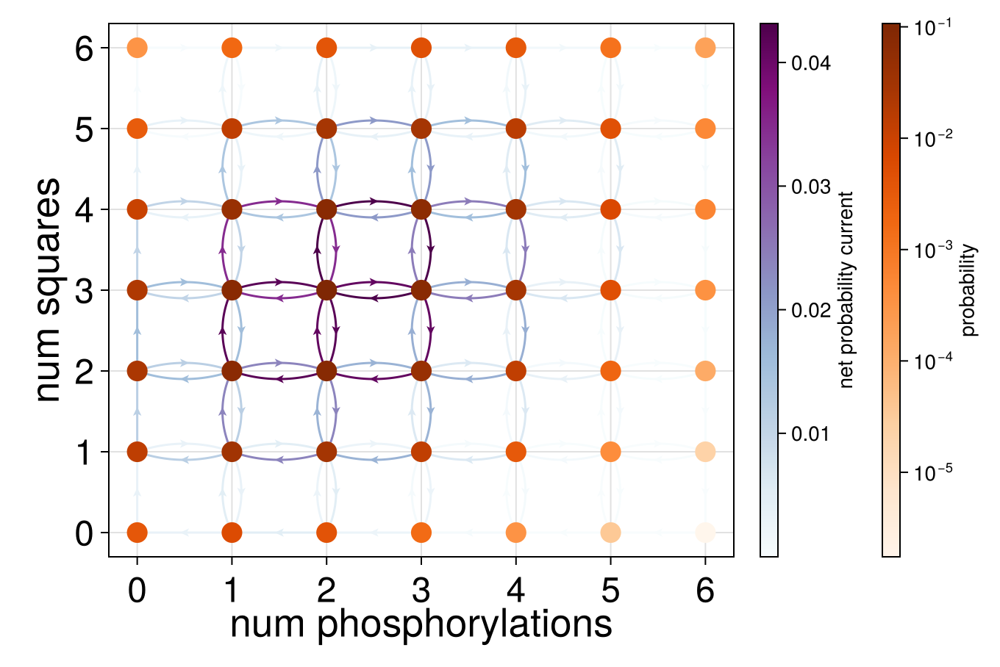

In [141]:
faa = plotca_macro(cca1, ss1;
    figure=ca_fig_params
)
adjust_faa1!(faa)
save("../outputs/POL2025Poster/code_plots/ca_bulk.svg", faa.figure)
faa

### Square

In [86]:
cca2 = cca_fact(1., 10., 1000., 0, 0., 0., 5, 0.1, 100.)
sss2 = steadystates(cca2)
ss2 = mean(sss2)

4096-element Vector{Float64}:
 0.00016842652291091135
 1.6237296683478642e-6
 1.6237296682358068e-6
 3.3194051024943102e-6
 1.6237296682752608e-6
 1.5291497277867954e-10
 3.3194051024902657e-6
 5.14553541074201e-6
 1.623729668248512e-6
 1.5366342688748923e-10
 1.5291499803228868e-10
 2.366312831871711e-10
 3.3194051023696914e-6
 ⋮
 2.8647469885158994e-10
 1.9203977825779058e-10
 1.9212226655308468e-10
 2.1607756331265697e-6
 6.302767122185568e-6
 4.224509335386614e-6
 1.9203978903098052e-10
 2.1607756331344815e-6
 4.224509335407487e-6
 2.1607756331666327e-6
 2.160775633170168e-6
 0.0023377737258164755

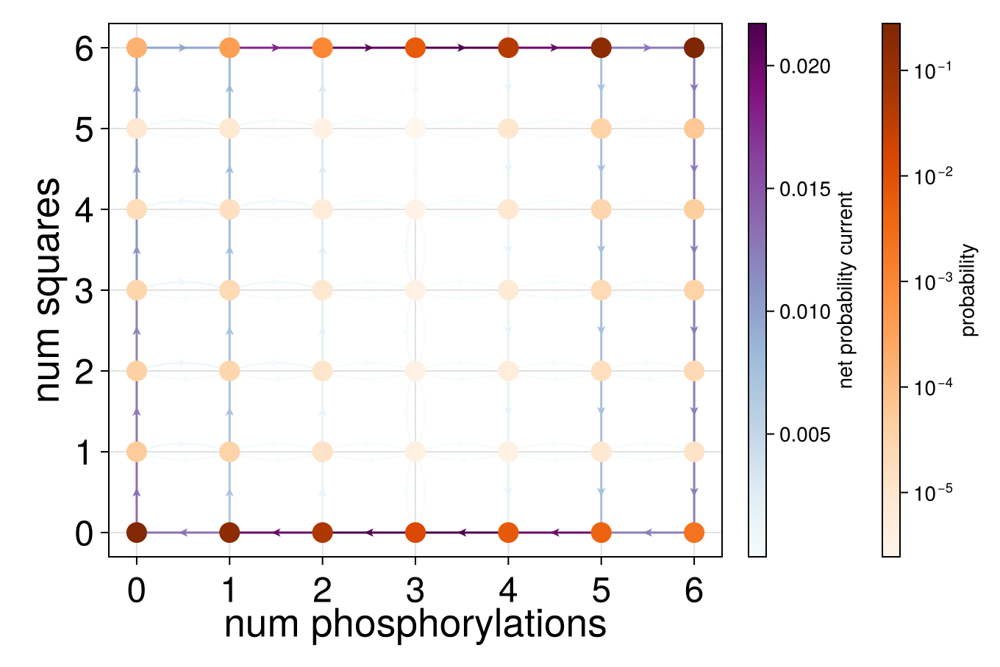

In [142]:
faa = plotca_macro(cca2, ss2;
    figure=ca_fig_params
)
adjust_faa1!(faa)
save("../outputs/POL2025Poster/code_plots/ca_square.svg", faa.figure)
faa

### True triangle

In [87]:
cca3 = cca_fact(1., 500., 1000., 0, 0., 0., 5, 0.1, 100.)
sss3 = steadystates(cca3)
ss3 = mean(sss3)

4096-element Vector{Float64}:
 6.87961730666884e-8
 3.3578537332588744e-8
 3.3578537363465835e-8
 1.4929265175428257e-7
 3.357853739976043e-8
 1.0883637003820075e-11
 1.492926517646362e-7
 5.574563985615673e-7
 3.357853735314464e-8
 1.2764832293719752e-11
 1.0883638405343288e-11
 3.654683052379352e-11
 1.4929265176864771e-7
 ⋮
 5.058522822957702e-10
 3.418150833079898e-10
 3.4168260957657865e-10
 3.865540010519403e-6
 1.1168803790512033e-5
 7.537272779636556e-6
 3.4181505178712256e-10
 3.865540010446418e-6
 7.537272779627518e-6
 3.865540010431279e-6
 3.8655400104351206e-6
 0.004148579294551459

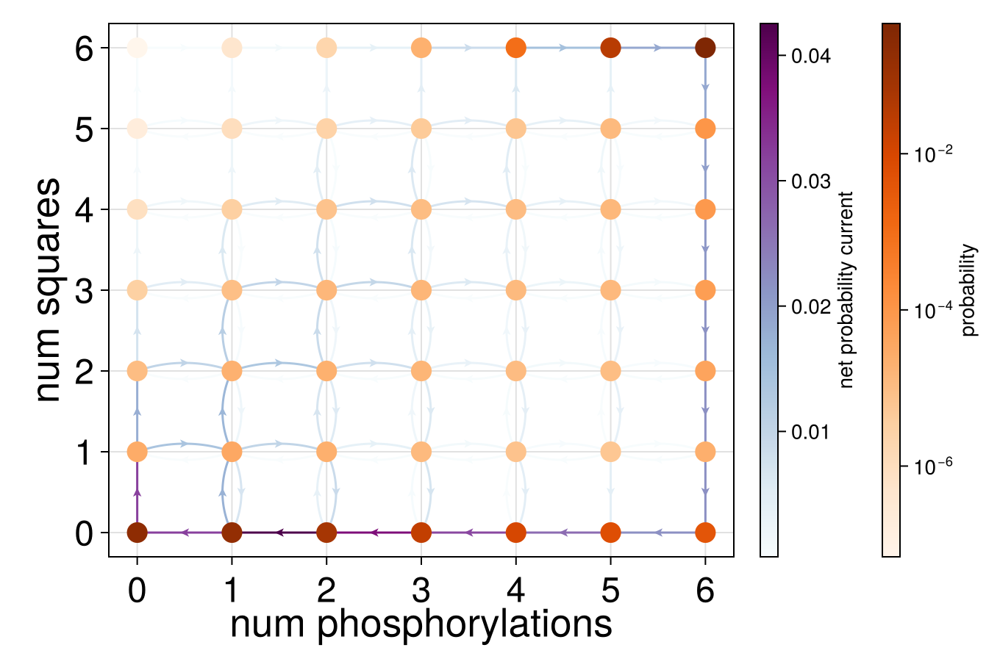

In [157]:
faa = plotca_macro(cca3, ss3;
    figure=ca_fig_params
)
adjust_faa1!(faa)
save("../outputs/POL2025Poster/code_plots/ca_true_triangle.svg", faa.figure)
faa

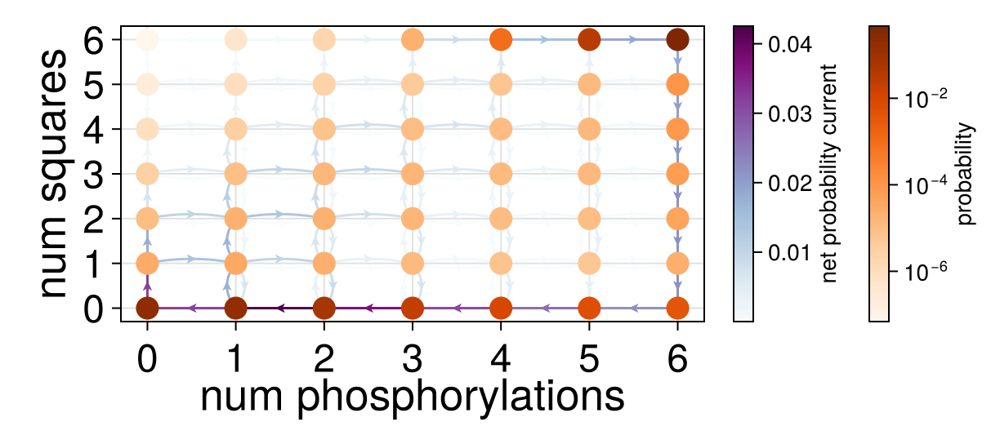

In [158]:
faa = plotca_macro(cca3, ss3;
    #figure=ca_fig_params
    figure=(; ca_fig_params..., size=(0.9*ca_fig_params.size[1], 0.6*ca_fig_params.size[2])) 
)
adjust_faa1!(faa)
save("../outputs/POL2025Poster/code_plots/ca_true_triangle_small.svg", faa.figure)
faa

(size = ((680.3149606299212, 453.5433070866141), 13.333333333333332), fontsize = 26.666666666666664, backgroundcolor = :transparent)

(size = (680.3149606299212, 226.77165354330705), fontsize = 26.666666666666664, backgroundcolor = :transparent)